# Algoritmos de densidad

## 1. Carga del dataset y preprocesamiento

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA
from sklearn import metrics
from scipy.spatial.distance import mahalanobis
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering, Birch, KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.metrics import silhouette_score, calinski_harabasz_score, silhouette_samples
import plotly.express as px

In [2]:
scaled_df = pd.read_csv('scaled_df.csv')
normalized_df = pd.read_csv('normalized_df.csv')
grouped_df = pd.read_csv('df_grouped.csv')

Tarea 4.2: Selección de eps y min_samples

Cálculo de distancias k-NN: Calcula la distancia al vecino más cercano (k=2 o 4) para cada punto en el dataset.
Usa herramientas como sklearn.neighbors.NearestNeighbors.
Grafica la curva de distancias ordenadas para determinar el radio (eps).

Elección de min_samples: Elige un valor de min_samples en función del tamaño del dataset y la densidad esperada:
Una regla común es min_samples ≈ dim * 2, donde dim es el número de dimensiones del dataset.

## Tarea 4.2

## 1

In [ ]:
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot as plt
 
neighbors = NearestNeighbors(n_neighbors=60)
neighbors_fit = neighbors.fit(normalized_df)
distances, indices = neighbors_fit.kneighbors(normalized_df)

In [ ]:
distances = np.sort(distances, axis=0)
distances = distances[:,1]


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

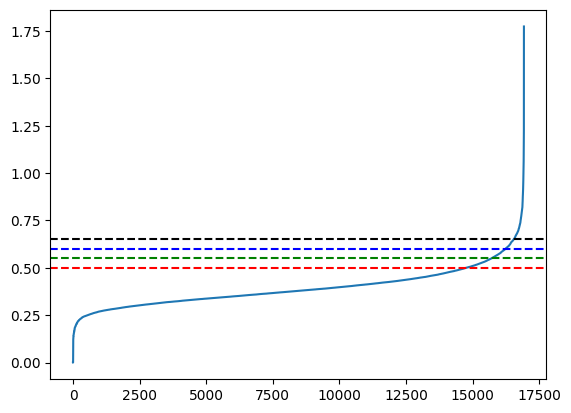

In [ ]:
plt.plot(distances)
# draw a horizontal line at y=0.5
plt.axhline(y=0.5, color='r', linestyle='--')
plt.axhline(y=0.55, color='g', linestyle='--')
plt.axhline(y=0.6, color='b', linestyle='--')
plt.axhline(y=0.65, color='k', linestyle='--')

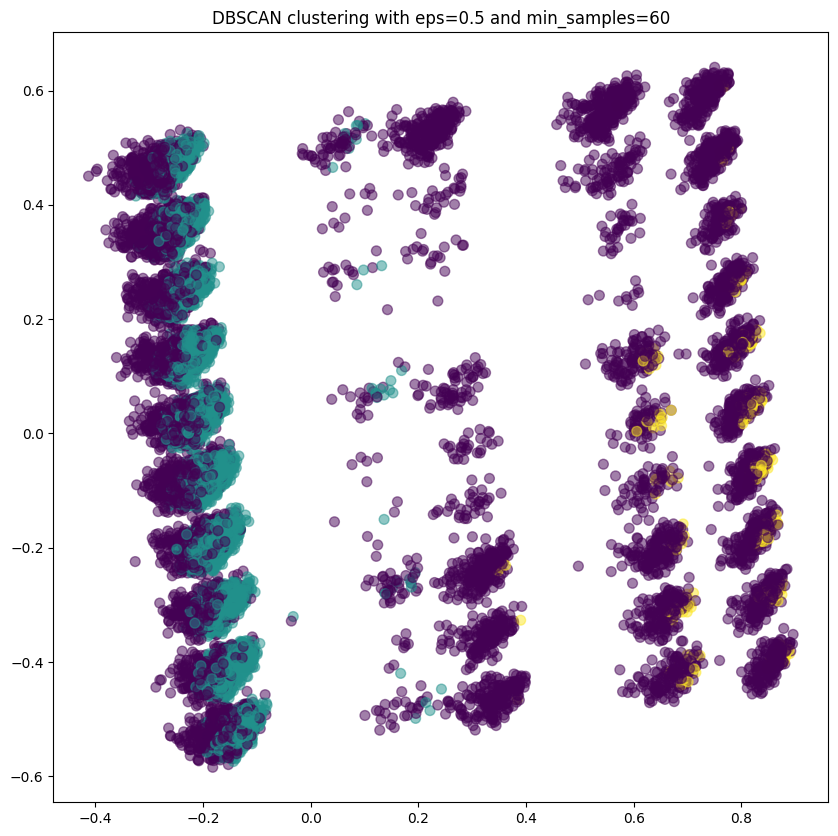

In [ ]:
# perform dbscan with eps=0.5 and min_samples=60
dbscan = DBSCAN(eps=0.5, min_samples=60)
dbscan.fit(normalized_df)
labels = dbscan.labels_

# PCA
pca = PCA(n_components=2)

# Fit and transform the data to the model
reduced_data = pca.fit_transform(normalized_df)

# plot the data
plt.figure(figsize=(10, 10))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', s=50, alpha=0.5)
plt.title('DBSCAN clustering with eps=0.5 and min_samples=60')
plt.show()

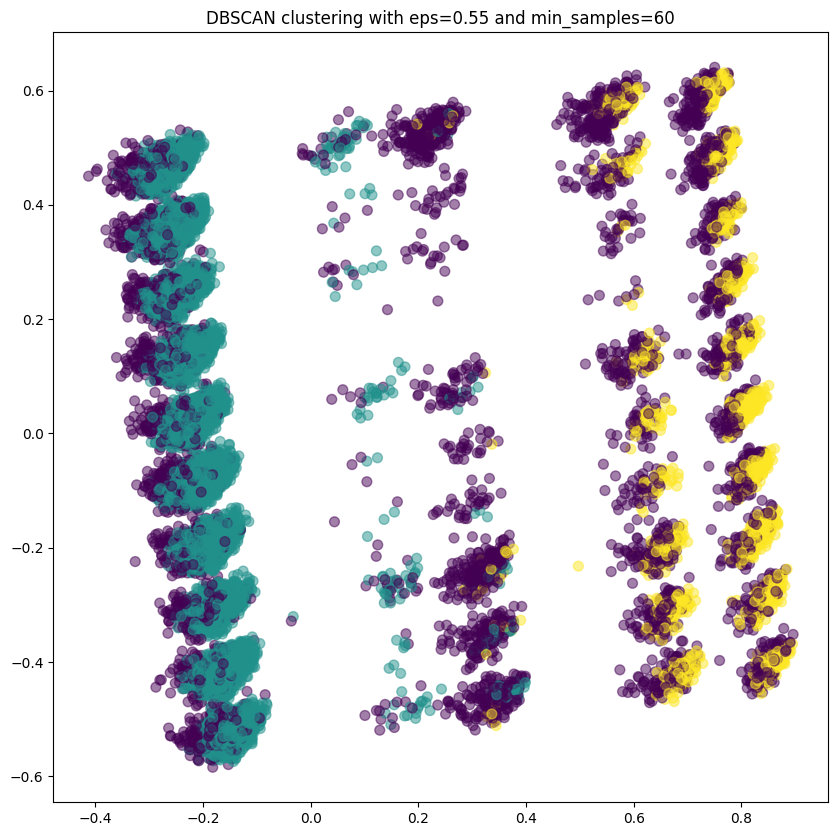

In [ ]:
# perform dbscan with eps=0.5 and min_samples=60
dbscan = DBSCAN(eps=0.55, min_samples=60)
dbscan.fit(normalized_df)
labels = dbscan.labels_

# PCA
pca = PCA(n_components=2)

# Fit and transform the data to the model
reduced_data = pca.fit_transform(normalized_df)

# plot the data
plt.figure(figsize=(10, 10))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=labels, cmap='viridis', s=50, alpha=0.5)
plt.title('DBSCAN clustering with eps=0.55 and min_samples=60')
plt.show()

In [ ]:
# calculate the shiluette
silhouette_score(normalized_df, labels)

0.12009023719620818

Establece el radio (eps) y número de puntos mínimo número más adecuado de clusters para el dataset proporcionado.

4.2 es mejor usar datos normalizados

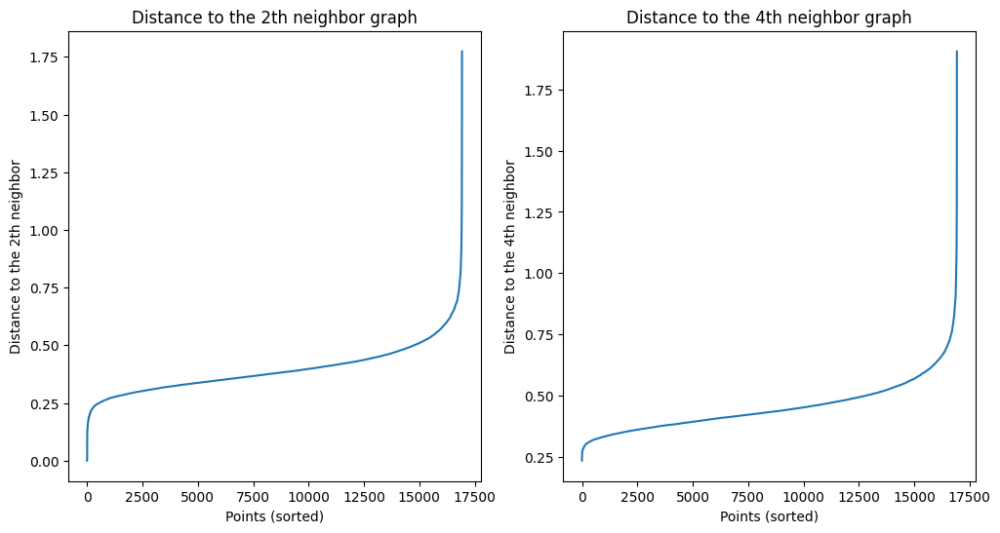

In [16]:
# 2 nearest neighbours
neighbors = NearestNeighbors(n_neighbors=2)  
neighbors_fit = neighbors.fit(normalized_df)
distances, indices = neighbors_fit.kneighbors(normalized_df)

distances = np.sort(distances[:, -1])  # Bierzemy 4-tego sąsiada (ostatnia kolumna)
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.plot(distances)
plt.xlabel("Points (sorted)")
plt.ylabel("Distance to the 2th neighbor")
plt.title("Distance to the 2th neighbor graph")

# 4 nearest neighbours
neighbors = NearestNeighbors(n_neighbors=4)  
neighbors_fit = neighbors.fit(normalized_df)
distances, indices = neighbors_fit.kneighbors(normalized_df)

distances = np.sort(distances[:, -1])  # Bierzemy 4-tego sąsiada (ostatnia kolumna)
plt.subplot(122)
plt.plot(distances)
plt.xlabel("Points (sorted)")
plt.ylabel("Distance to the 4th neighbor")
plt.title("Distance to the 4th neighbor graph")
plt.show()


In both cases the curve changes its shape around the distance ~0.5–0.6 which is the value of eps we should be using. 

When it comes to min_samples, this value is dependent on the number of features, usually number of features + 1.

In [17]:
num_features = normalized_df.shape[1]
num_features

30

In [18]:
min_samples = num_features + 1

## Tarea 4.3

¿Cómo varía la calidad del clustering con diferentes valores de 'eps' y de minpoints?

Davis-Bouldin Index (DBI): Ocena opiera się na odległości między centrami klastrów oraz ich rozproszeniu. Im mniejsza wartość, tym lepsza jakość klasteryzacji. DBI jest bardziej odpowiedni dla algorytmów, które generują gęste klastry, jak DBSCAN.

In [66]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns

def evaluate_clustering_with_dbscan_and_quality_index(data, eps_range=np.arange(0.1, 2.0, 0.1), min_samples_range=range(2, 10), quality_index='silhouette'):
    """
    Evalúa la calidad del clustering DBSCAN para diferentes valores de eps y min_samples utilizando índices de calidad seleccionados.
    
    Parámetros:
        - data: Dataset a clusterizar (array-like).
        - quality_index: Índice de calidad ('silhouette').
        - eps_range: Rango de valores para el parámetro eps (default: np.arange(0.1, 2.0, 0.1)).
        - min_samples_range: Rango de valores para el parámetro min_samples (default: range(2, 10)).
    """
    # Validar el índice de calidad
    valid_indices = ['silhouette']
    if quality_index not in valid_indices:
        raise ValueError(f"Índice de calidad no válido. Elija entre {valid_indices}.")
    
    # Inicializar listas para los resultados
    silhouette_scores = []

    # Calcular el número total de combinaciones de eps y min_samples
    num_combinations = len(eps_range) * len(min_samples_range)
    
    # Configurar la cuadrícula de visualización dinámica (basada en el número total de combinaciones)
    num_columns = 3  # Número de columnas fijas
    num_rows = int(np.ceil(num_combinations / num_columns))  # Número de filas dinámicas
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))  # Ajuste de tamaño dinámico
    axes = axes.flatten()  # Convertir en un array 1D para acceder a los subgráficos

    plot_index = 0  # Para llevar el control de qué gráfico dibujar

    for eps in eps_range:
        for min_samples in min_samples_range:
            # Aplicar DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(data)

            # Evitar puntos de ruido (-1)
            if len(set(labels)) > 1:
                # Calcular el índice de calidad (Silhouette) solo si hay más de un clúster
                try:
                    score = silhouette_score(data, labels)
                except ValueError:
                    score = -1  # Valor negativo si el índice no se puede calcular
            else:
                score = -1  # No se puede calcular si no hay al menos 2 clústeres

            silhouette_scores.append(score)

            # Reducir datos a 2D con PCA para visualización
            pca = PCA(n_components=2)
            data_2D = pca.fit_transform(data)

            # Gráfico de dispersión de clusters coloreados
            sns.scatterplot(
                x=data_2D[:, 0], y=data_2D[:, 1], hue=labels, 
                palette=sns.color_palette("tab10", len(set(labels))), ax=axes[plot_index], s=50, legend=None
            )
            axes[plot_index].set_title(f"Eps={eps:.1f}, MinPts={min_samples} - Silhouette: {score:.4f}")
            axes[plot_index].set_xlabel('Componente Principal 1')
            axes[plot_index].set_ylabel('Componente Principal 2')

            plot_index += 1

    # Ajustar disposición de los gráficos
    plt.tight_layout()
    plt.show()


In [92]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score
import matplotlib.pyplot as plt
import seaborn as sns

def evaluate_clustering_with_dbscan_and_quality_index(data, eps_range=np.arange(0.1, 2.0, 0.1), min_samples_range=range(2, 10), quality_index='davis_bouldin'):
    """
    Evalúa la calidad del clustering DBSCAN para diferentes valores de eps y min_samples utilizando índices de calidad seleccionados.
    
    Parámetros:
        - data: Dataset a clusterizar (array-like).
        - quality_index: Índice de calidad ('davis_bouldin').
        - eps_range: Rango de valores para el parámetro eps (default: np.arange(0.1, 2.0, 0.1)).
        - min_samples_range: Rango de valores para el parámetro min_samples (default: range(2, 10)).
    """
    # Validar el índice de calidad
    valid_indices = ['davis_bouldin']
    if quality_index not in valid_indices:
        raise ValueError(f"Índice de calidad no válido. Elija entre {valid_indices}.")
    
    # Inicializar listas para los resultados
    davis_bouldin_scores = []

    # Calcular el número total de combinaciones de eps y min_samples
    num_combinations = len(eps_range) * len(min_samples_range)
    
    # Configurar la cuadrícula de visualización dinámica (basada en el número total de combinaciones)
    num_columns = 3  # Número de columnas fijas
    num_rows = int(np.ceil(num_combinations / num_columns))  # Número de filas dinámicas
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))  # Ajuste de tamaño dinámico
    axes = axes.flatten()  # Convertir en un array 1D para acceder a los subgráficos

    plot_index = 0  # Para llevar el control de qué gráfico dibujar

    for eps in eps_range:
        for min_samples in min_samples_range:
            # Aplicar DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(data)

            # Evitar puntos de ruido (-1)
            if len(set(labels)) > 1:
                # Calcular el índice de calidad (Davis-Bouldin) solo si hay más de un clúster
                try:
                    score = davies_bouldin_score(data, labels)
                except ValueError:
                    score = np.nan  # Valor NaN si no se puede calcular el índice
            else:
                score = np.nan  # No se puede calcular si no hay al menos 2 clústeres

            davis_bouldin_scores.append(score)

            # Reducir datos a 2D con PCA para visualización
            pca = PCA(n_components=2)
            data_2D = pca.fit_transform(data)

            # Gráfico de dispersión de clusters coloreados
            sns.scatterplot(
                x=data_2D[:, 0], y=data_2D[:, 1], hue=labels, 
                palette=sns.color_palette("tab10", len(set(labels))), ax=axes[plot_index], s=50, legend=None
            )
            axes[plot_index].set_title(f"Eps={eps:.2f}, MinPts={min_samples} - DBI: {score:.4f}")
            axes[plot_index].set_xlabel('Componente Principal 1')
            axes[plot_index].set_ylabel('Componente Principal 2')

            plot_index += 1

    # Ajustar disposición de los gráficos
    plt.tight_layout()
    plt.show()

### eps = 0.5

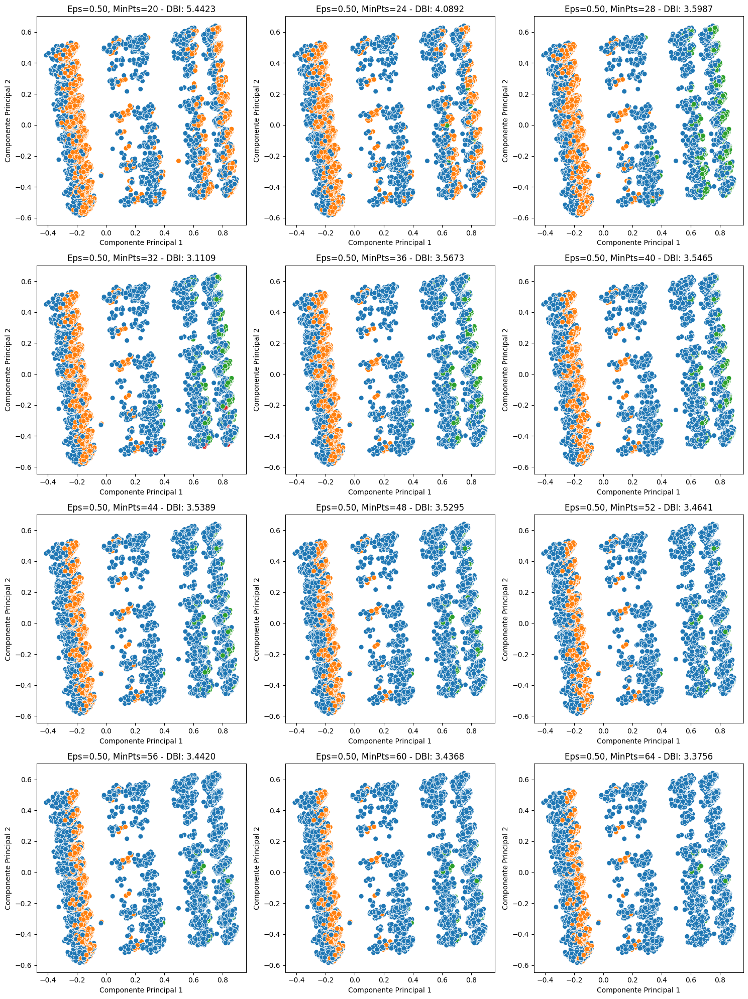

In [93]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.5], min_samples_range=range(20, 68, 4), quality_index='davis_bouldin')

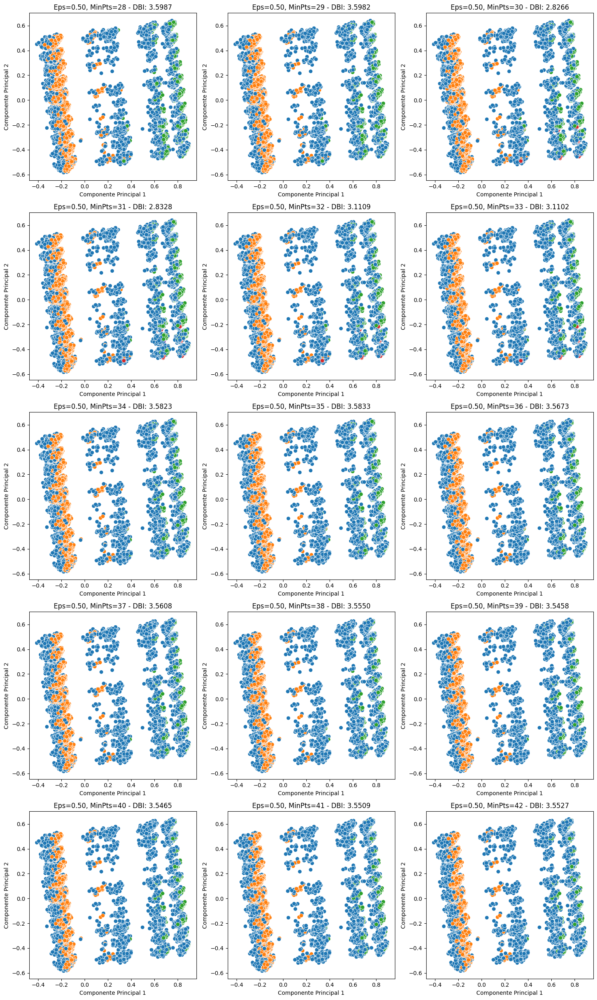

In [94]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.5], min_samples_range=range(28, 43), quality_index='davis_bouldin')

Best silhouette score: MinPts=34

### eps = 0.55

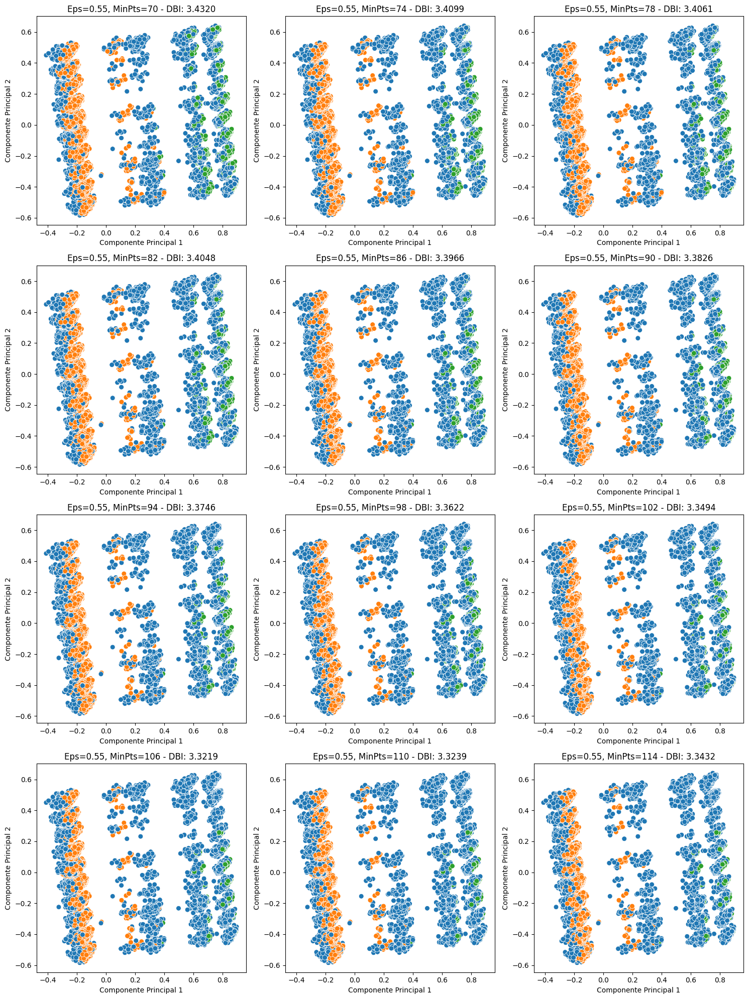

In [101]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.55], min_samples_range=range(70, 118, 4), quality_index='davis_bouldin')

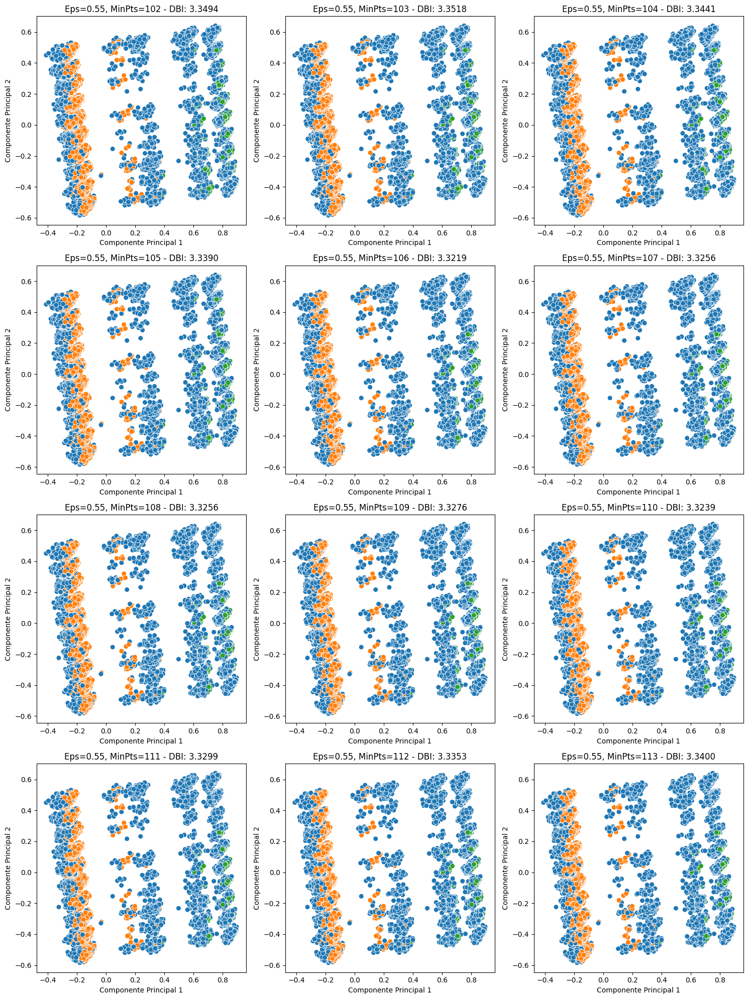

In [102]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.55], min_samples_range=range(102, 114), quality_index='davis_bouldin')

Best silhouette: MinPts = 51

### eps = 0.6

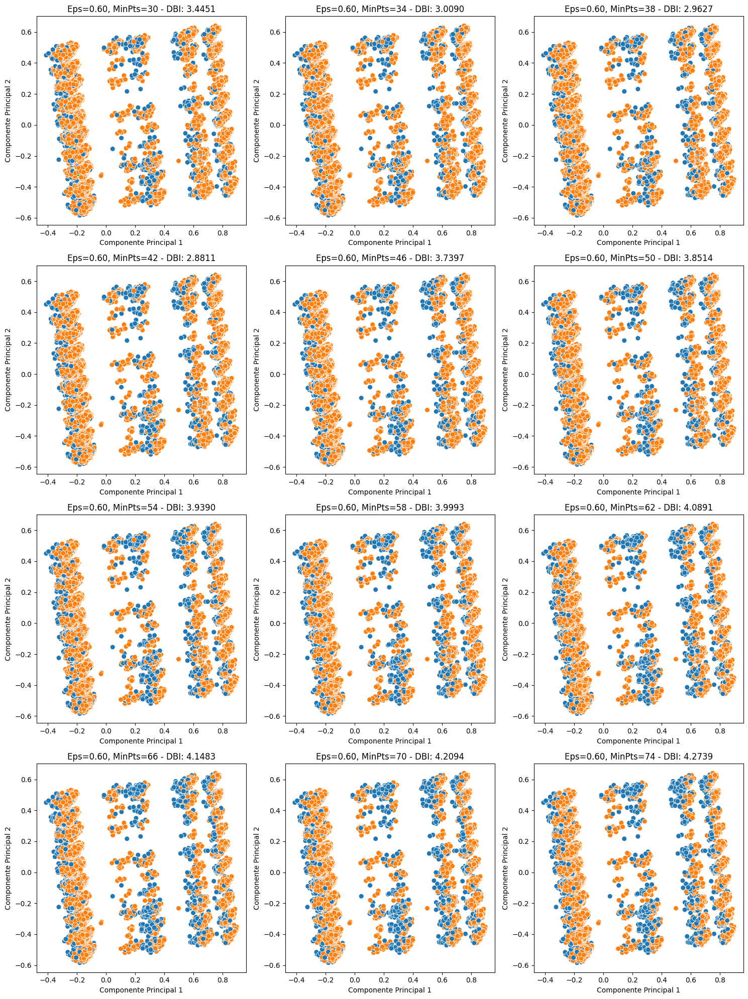

In [97]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.60], min_samples_range=range(30, 78, 4), quality_index='davis_bouldin')

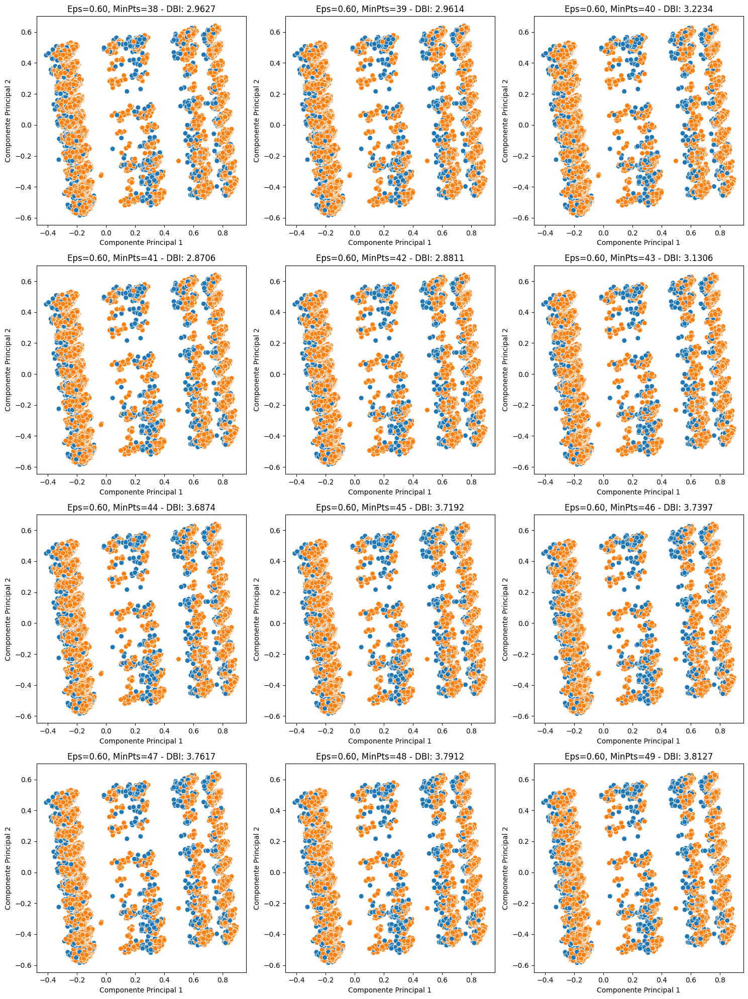

In [104]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.60], min_samples_range=range(38, 50), quality_index='davis_bouldin')

Best silhouette: MinPts = 44

### eps = 0.65

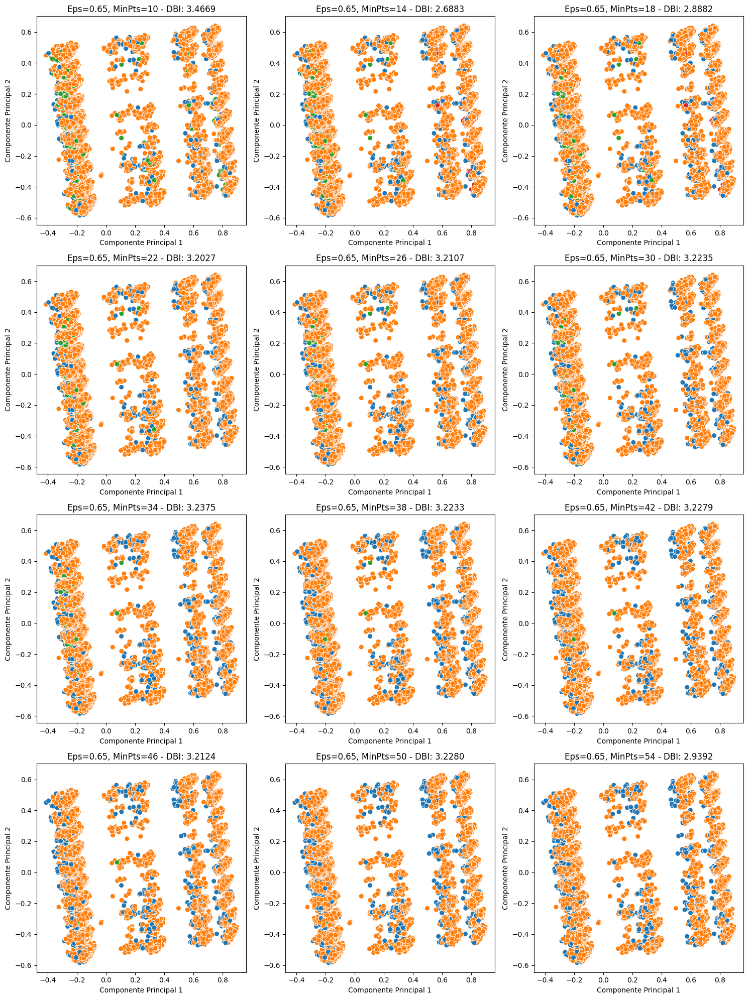

In [107]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.65], min_samples_range=range(10, 58, 4), quality_index='davis_bouldin')

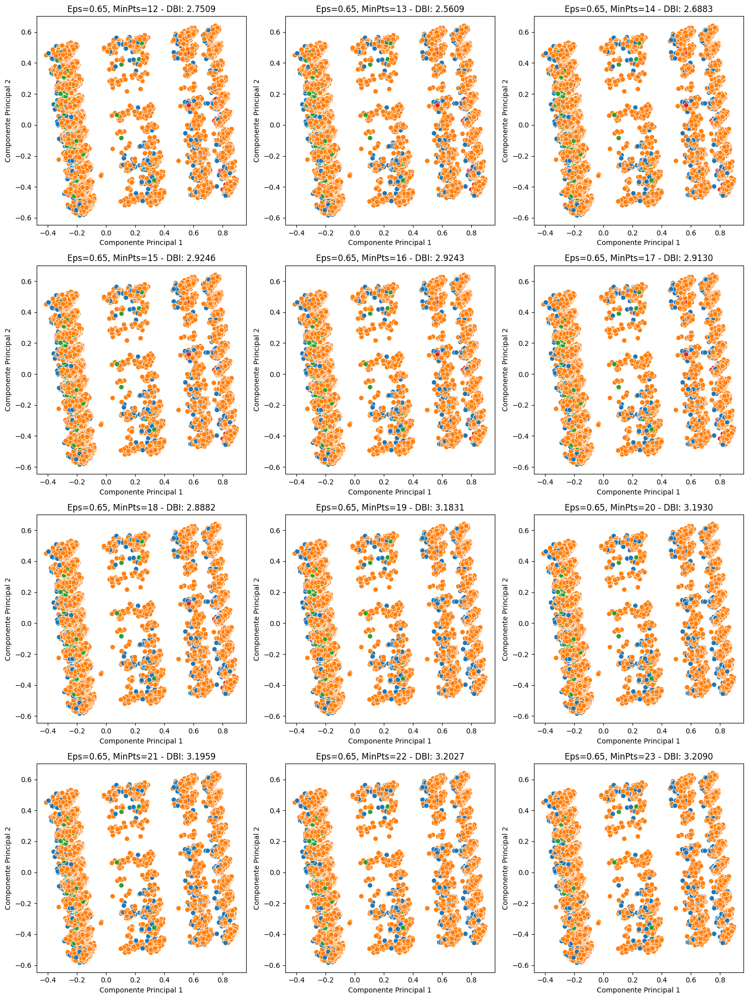

In [108]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.65], min_samples_range=range(12, 24), quality_index='davis_bouldin')

### eps = 0.70

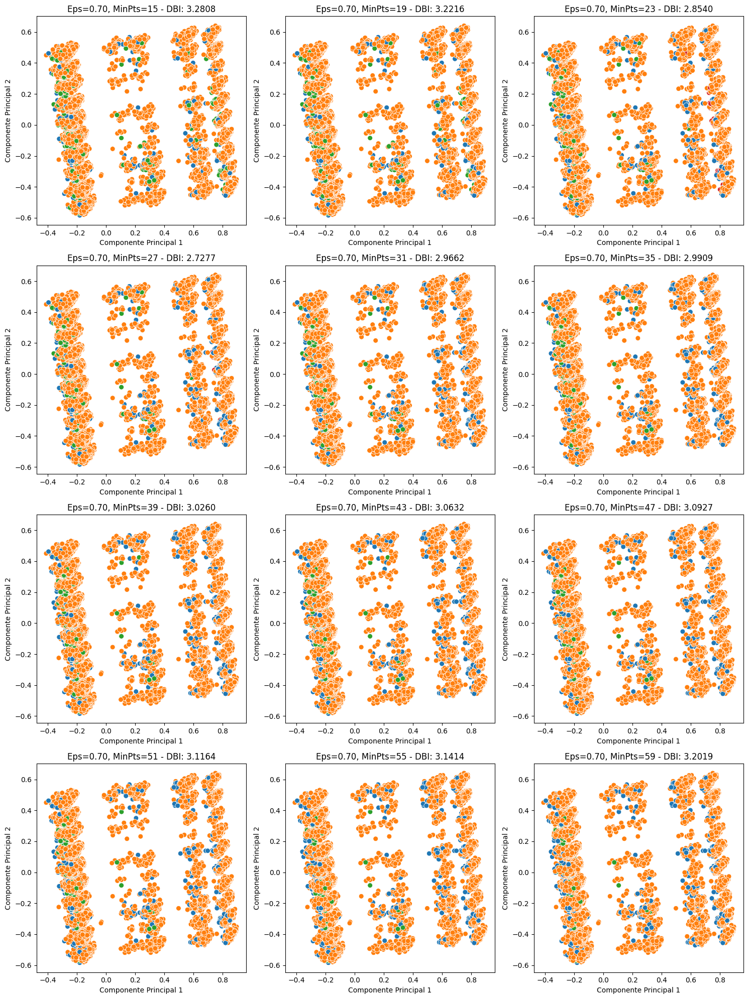

In [110]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.70], min_samples_range=range(15, 63, 4), quality_index='davis_bouldin')

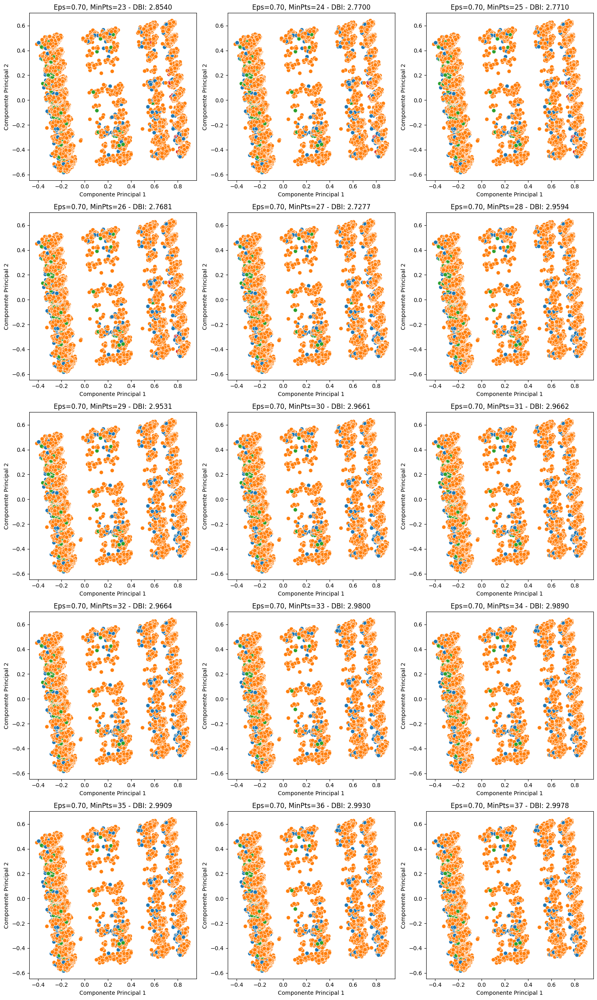

In [111]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.70], min_samples_range=range(23, 38), quality_index='davis_bouldin')

### eps = 0.75

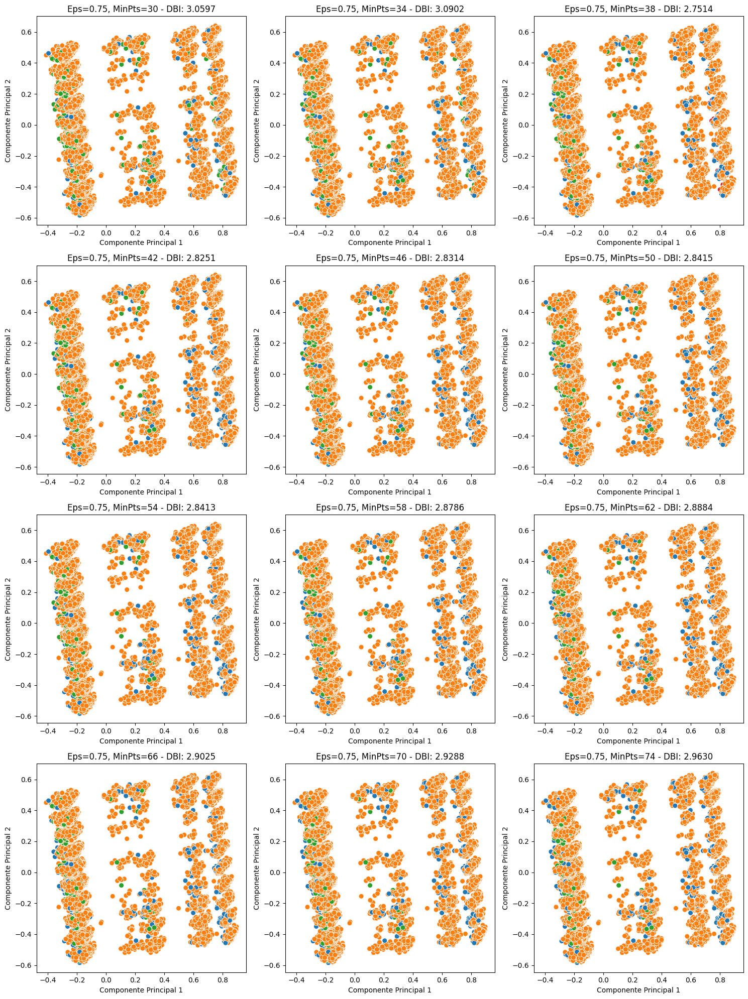

In [112]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.75], min_samples_range=range(30, 78, 4), quality_index='davis_bouldin')

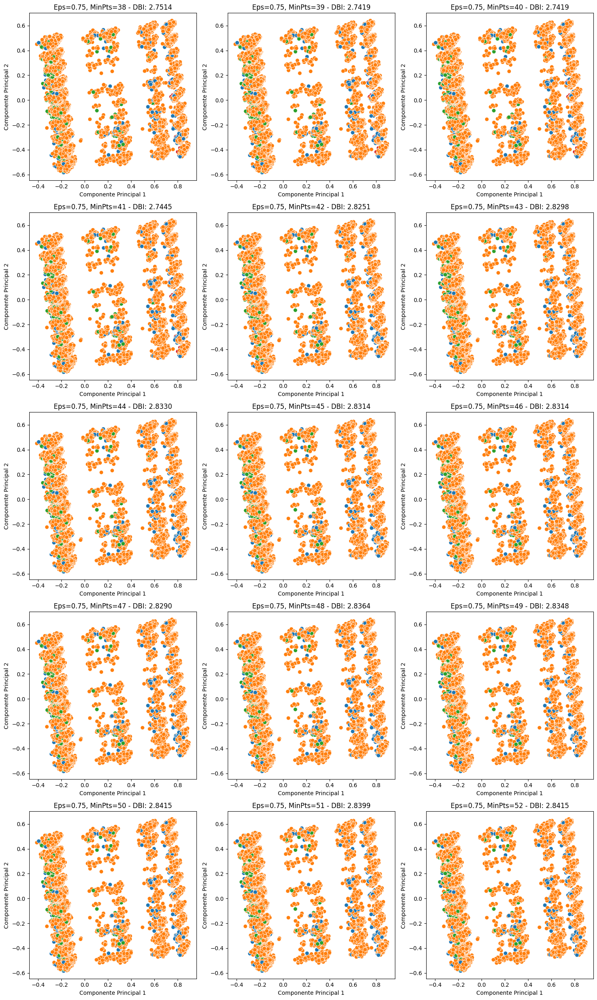

In [116]:
evaluate_clustering_with_dbscan_and_quality_index(normalized_df, eps_range=[0.75], min_samples_range=range(38, 53), quality_index='davis_bouldin')

### Conclusion

Silhouette -> the highest

eps = 0.50, MinPts = 34, Silhouette = 0.0749  
eps = 0.50, MinPts = 30, DBI = 2.8266

eps = 0.55, MinPts = 51, Silhouette = 0.1293  
eps = 0.55, MinPts = 106, DBI = 3.3219

eps = 0.60, MinPts = 44, Silhouette = 0.1704  
eps = 0.60, MinPts = 41, DBI = 2.8706

eps = 0.65, MinPts = 19, Silhouette = 0.1947  
eps = 0.65, MinPts = 13, DBI = 2.5609

eps = 0.70, MinPts = 27, DBI = 2.7277

eps = 0.70, MinPts = 30/31, DBI = 2.7419


Davis-Bouldin -> the lowest

## Tarea 4.4

Utiliza por lo menos dos índices de calidad de clustering y analiza sus resultados.

In [151]:
def analyse_results():
    print(f"Silhouette Coefficient: {metrics.silhouette_score(normalized_df, labels):.3f}")
    print(f"Calinski-Harabasz Index: {metrics.calinski_harabasz_score(normalized_df, labels):.3f}")
    print(f"Davies-Bouldin Index: {metrics.davies_bouldin_score(normalized_df, labels):.3f}")

In [118]:
normalized_df.shape

(16929, 30)

In [152]:
db = DBSCAN(eps=0.65, min_samples=19).fit(normalized_df)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 2
Estimated number of noise points: 787


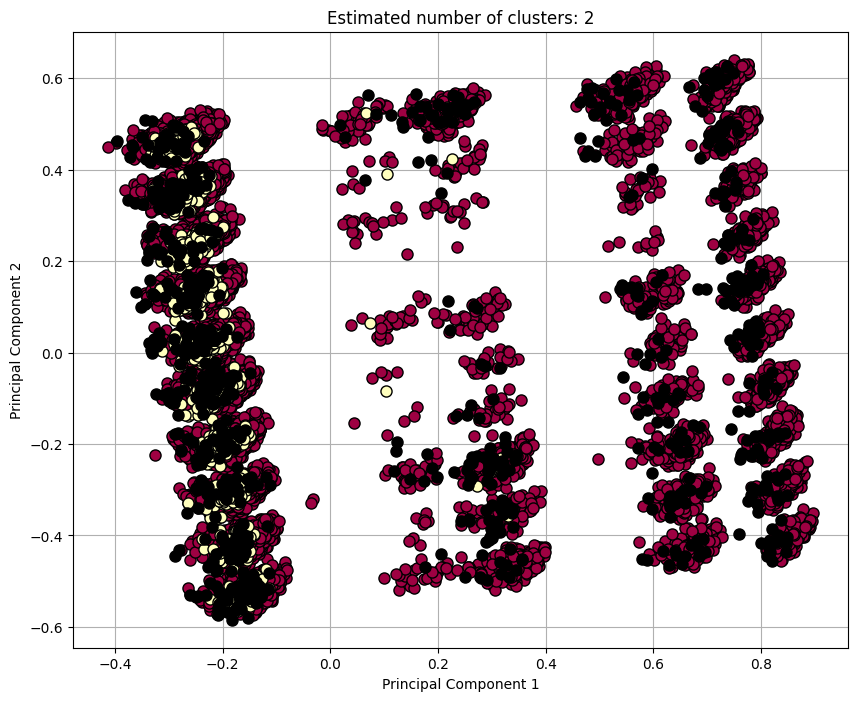

In [153]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Redukcja wymiarów za pomocą PCA (do 2 wymiarów)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

# Tworzenie wykresu klastrów
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Kolor dla szumu (noise)
        col = [0, 0, 0, 1]  # czarny kolor

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


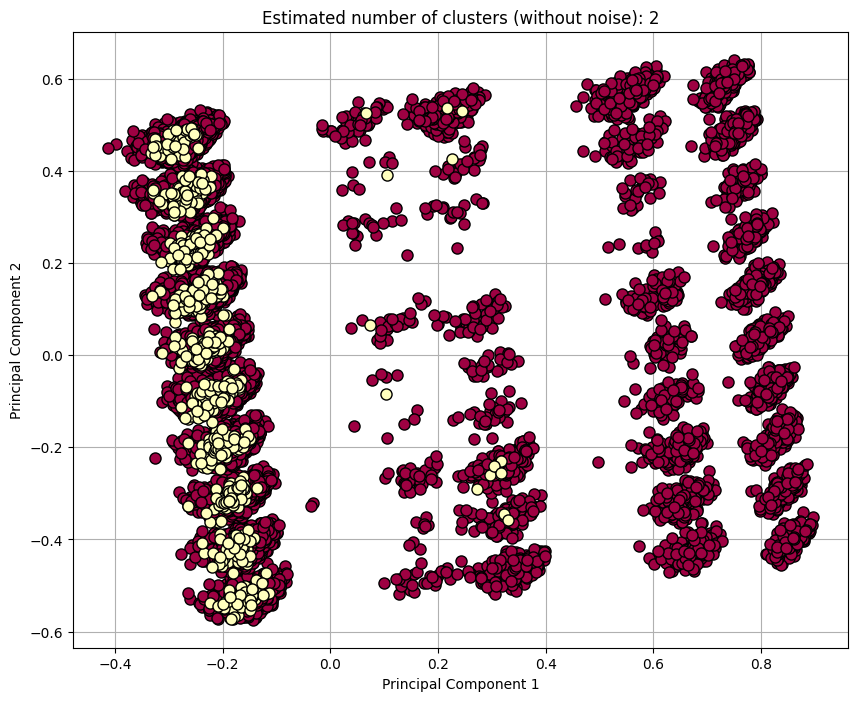

In [154]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Redukcja wymiarów za pomocą PCA (do 2 wymiarów)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

# Tworzenie wykresu klastrów bez punktów szumu
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  # Pomijamy punkty oznaczone jako szum

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


In [155]:
analyse_results()

Silhouette Coefficient: 0.195
Calinski-Harabasz Index: 616.970
Davies-Bouldin Index: 3.183


In [156]:
db = DBSCAN(eps=0.65, min_samples=13).fit(normalized_df)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 5
Estimated number of noise points: 644


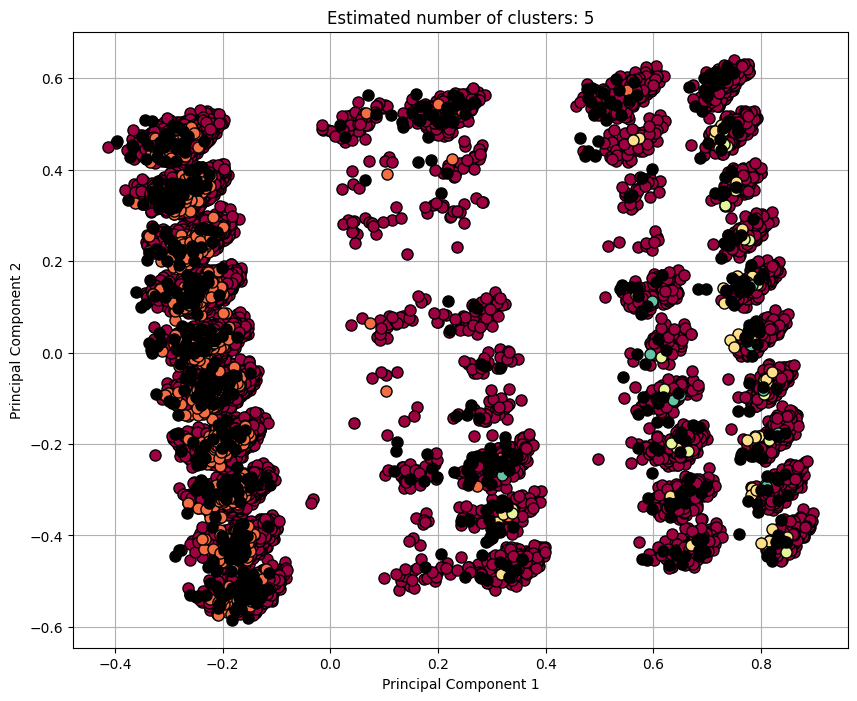

In [144]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Redukcja wymiarów za pomocą PCA (do 2 wymiarów)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

# Tworzenie wykresu klastrów
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Kolor dla szumu (noise)
        col = [0, 0, 0, 1]  # czarny kolor

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


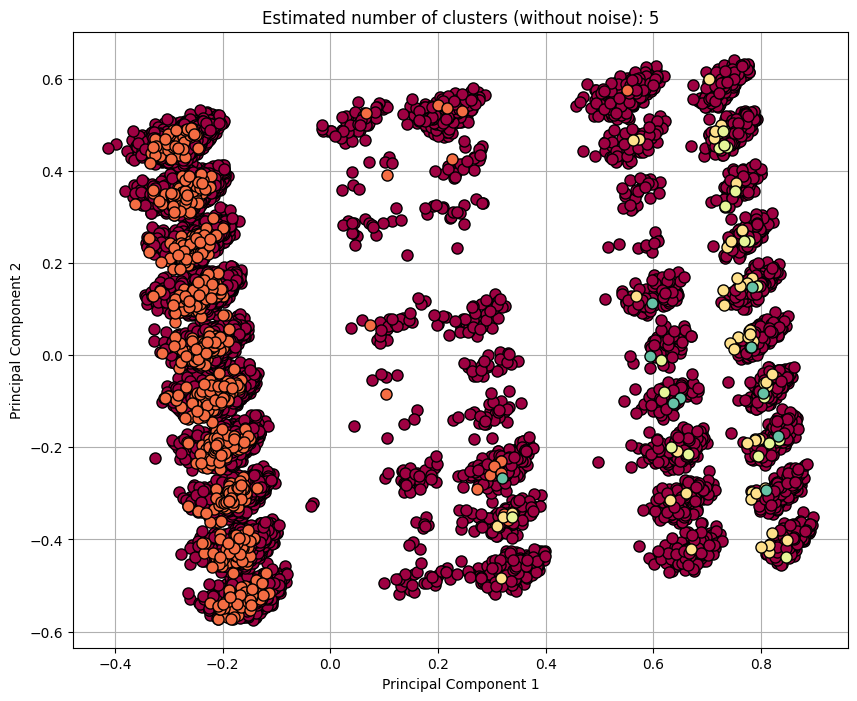

In [143]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Redukcja wymiarów za pomocą PCA (do 2 wymiarów)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

# Tworzenie wykresu klastrów bez punktów szumu
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  # Pomijamy punkty oznaczone jako szum

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


In [157]:
analyse_results()

Silhouette Coefficient: 0.161
Calinski-Harabasz Index: 271.993
Davies-Bouldin Index: 2.561


In [158]:
db = DBSCAN(eps=0.65, min_samples=15).fit(normalized_df)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 3
Estimated number of noise points: 704


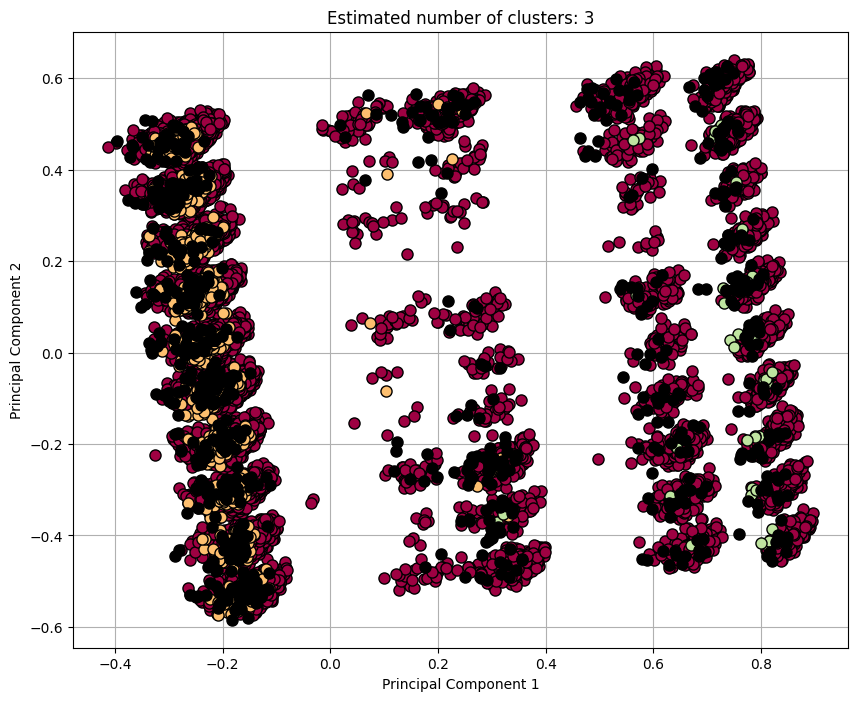

In [146]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Redukcja wymiarów za pomocą PCA (do 2 wymiarów)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

# Tworzenie wykresu klastrów
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Kolor dla szumu (noise)
        col = [0, 0, 0, 1]  # czarny kolor

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


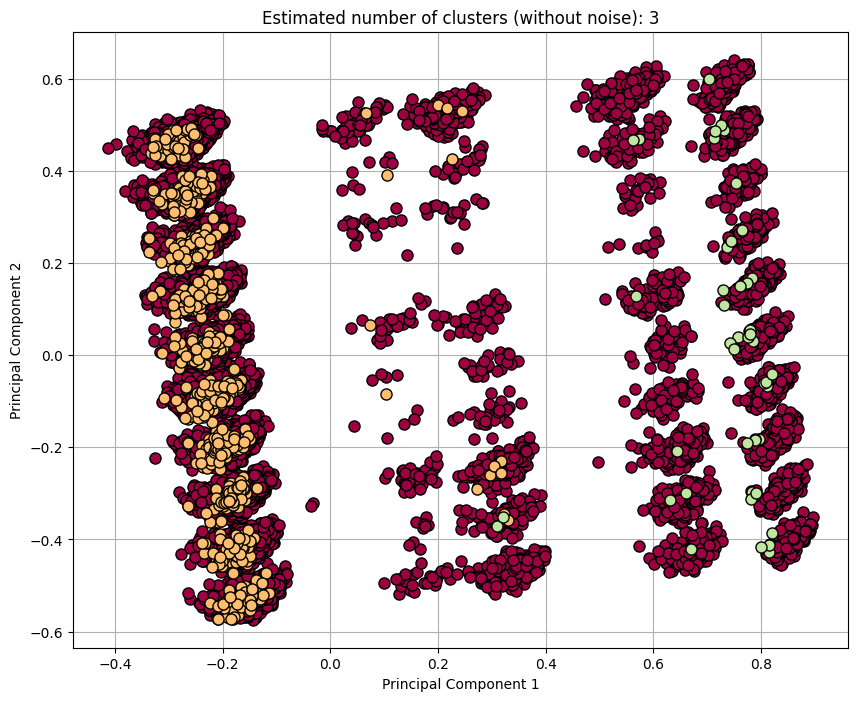

In [147]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Redukcja wymiarów za pomocą PCA (do 2 wymiarów)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

# Tworzenie wykresu klastrów bez punktów szumu
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  # Pomijamy punkty oznaczone jako szum

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


In [159]:
analyse_results()

Silhouette Coefficient: 0.176
Calinski-Harabasz Index: 434.566
Davies-Bouldin Index: 2.925


In [160]:
db = DBSCAN(eps=0.65, min_samples=18).fit(normalized_df)
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

Estimated number of clusters: 3
Estimated number of noise points: 753


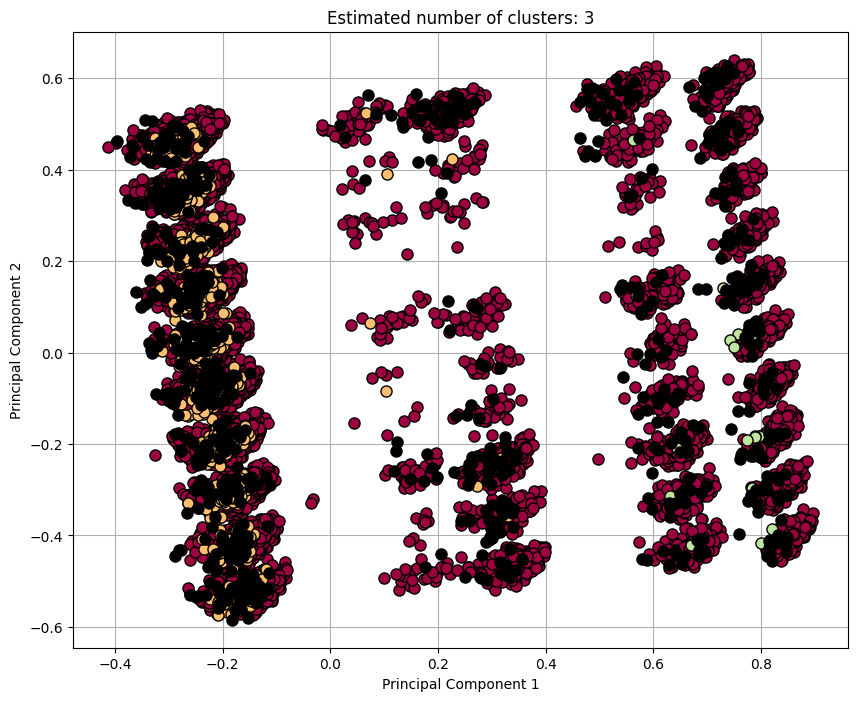

In [149]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Redukcja wymiarów za pomocą PCA (do 2 wymiarów)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

# Tworzenie wykresu klastrów
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        # Kolor dla szumu (noise)
        col = [0, 0, 0, 1]  # czarny kolor

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters: {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


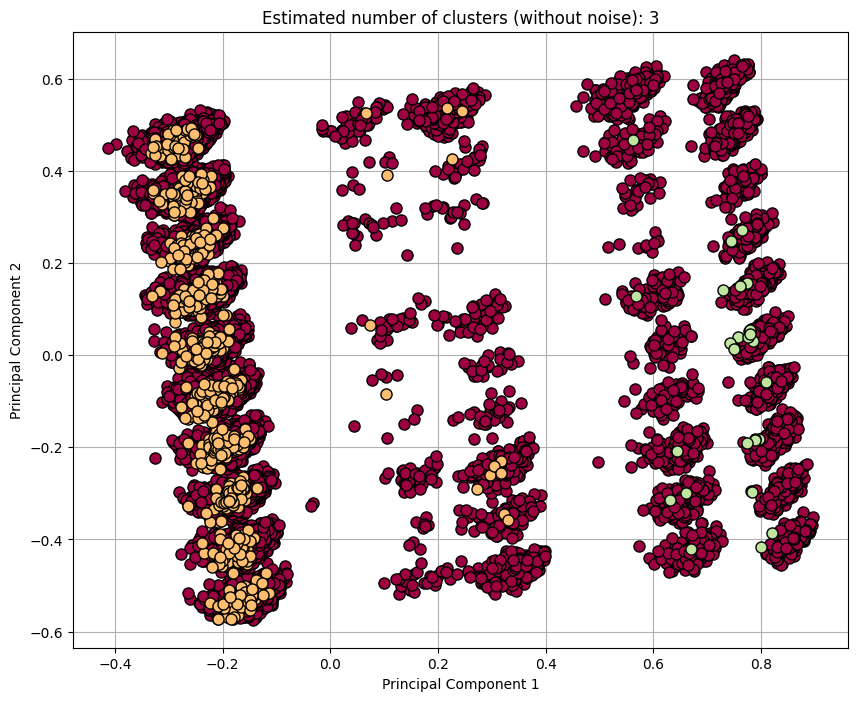

In [150]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Redukcja wymiarów za pomocą PCA (do 2 wymiarów)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_df)

# Tworzenie wykresu klastrów bez punktów szumu
unique_labels = set(labels)
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]

plt.figure(figsize=(10, 8))

for k, col in zip(unique_labels, colors):
    if k == -1:
        continue  # Pomijamy punkty oznaczone jako szum

    class_member_mask = (labels == k)

    xy = reduced_data[class_member_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor='k', markersize=8)

plt.title(f'Estimated number of clusters (without noise): {n_clusters_}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


In [161]:
analyse_results()

Silhouette Coefficient: 0.170
Calinski-Harabasz Index: 422.261
Davies-Bouldin Index: 2.888


### Indice 1 -

### indice 2 - 

## Tarea 4.5

¿Cuál es el número óptimo de clusters? ¿por qué?